# PUNCH Coronagraph — Brightest Stars (no corona mask)

**Purpose:** Run MEE Tab 1 centroid finding on the **raw February 2026 PUNCH frame** (no circle mask), keep the **50 brightest** detections by flux, and validate them against **Gaia G < 4**.

| Setting | Value |
|---------|-------|
| Input | `PUNCH_L3_CAM_20260219001600_v0j_MEE.fits` (Feb 19, 2026) |
| Corona mask | **OFF** (raw image) |
| `sigma_thresh` | 10 |
| `min_area` | 2 |
| `N_BRIGHTEST` | 50 |
| `GAIA_MAG_LIMIT` | 4.0 |
| Output | `Coronagraph Runs/punch_tab1_bright/` |

**Run order:** Setup → Config → Preview → Validate → Step 1 → Results → Brightest filter → Gaia match (needs internet).

---
## Setup: Import Libraries and Initialize

In [ ]:
# ============================================================================
# IMPORTS
# ============================================================================
import os
import sys
from pathlib import Path
import zipfile

import numpy as np
import pandas as pd

from astropy.io import fits
from astropy.coordinates import EarthLocation, SkyCoord
from astropy.time import Time

from mee2024 import stacker_implementation
from mee2024 import database_cache

import matplotlib.pyplot as plt
%matplotlib inline

print("Initializing star catalog database...")
database_cache.prepare_triangles()
print("Database ready!")


Initializing star catalog database...
preparing
Database ready!


working on loading triangles
preloaded triangles
finished preparation work


---
## Step 1 — Find Centroids (raw PUNCH, no mask)

Loads the February 2026 PUNCH frame and runs `do_stack()` with the same detection settings as run 03, but **without** any circle-mask preprocessing.

In [2]:
# ============================================================================
# STEP 1 CONFIG — PUNCH bright-star run (no corona mask)
# ============================================================================
from pathlib import Path

PROJECT_ROOT = Path("/Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder")

# February 2026 PUNCH frame (MEE-ready FITS)
zenith_light_files = [
    str(PROJECT_ROOT / "PUNCH_L3_CAM_20260219001600_v0j_MEE.fits"),
]
zenith_dark_files = []
zenith_flat_files = []

output_directory = str(PROJECT_ROOT / "Coronagraph Runs" / "punch_tab1_bright")
Path(output_directory).mkdir(parents=True, exist_ok=True)

# Brightest-star workflow knobs
N_BRIGHTEST = 50          # keep top-N centroids by flux after Step 1
GAIA_MAG_LIMIT = 4.0      # Gaia catalog cut (G < 4)

TAB1_SETTINGS = {
    'flag_display': True,
    'save_dark_flat': False,
    'float_fits': False,
    'd': 200,
    'delete_saturated_blob': False,
    'blob_saturation_level': 95,
    'blob_radius_extra': 350,
    'centroid_gap_blob': 175,
    'centroid_gaussian_subtract': True,
    'sensitive_mode_stack': True,
    'centroid_gaussian_thresh': 10.0,
    'min_area': 2,
    'sigma_subtract': 0.0,
    'background_subtraction_mode': 'annular',
    'remove_edgy_centroids': True,
}

TAB1_DO_NOT_TOUCH = {
    'm': 30,
    'n': 30,
    'pxl_tol': 10,
    'cutoff': 100,
    'img_edge_distance': 5,
    'rough_match_threshhold': 36,
    'sanity_check_centroids': True,
    'experimental_background_subtract': False,
    'workDir': '',
    'workDir2': '',
    '-DARK-': '',
    '-FLAT-': '',
    'database': '',
    'flag_debug': False,
    'flag_display2': False,
}

options = {**TAB1_DO_NOT_TOUCH, **TAB1_SETTINGS, 'output_dir': output_directory}

print("Step 1 configuration (bright-star run, NO corona mask)")
print(f"  Input FITS : {zenith_light_files[0]}")
print(f"  Output dir : {output_directory}")
print(f"  sigma_thresh={options['centroid_gaussian_thresh']}, min_area={options['min_area']}")
print(f"  N_BRIGHTEST={N_BRIGHTEST}, GAIA_MAG_LIMIT={GAIA_MAG_LIMIT}")
print(f"  Corona mask: OFF")


Step 1 configuration (bright-star run, NO corona mask)
  Input FITS : /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/PUNCH_L3_CAM_20260219001600_v0j_MEE.fits
  Output dir : /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_tab1_bright
  sigma_thresh=10.0, min_area=2
  N_BRIGHTEST=50, GAIA_MAG_LIMIT=4.0
  Corona mask: OFF


### Preview raw PUNCH image

Quick look at the unmasked February frame (stereocor2 colormap, same as STEREO COR2).

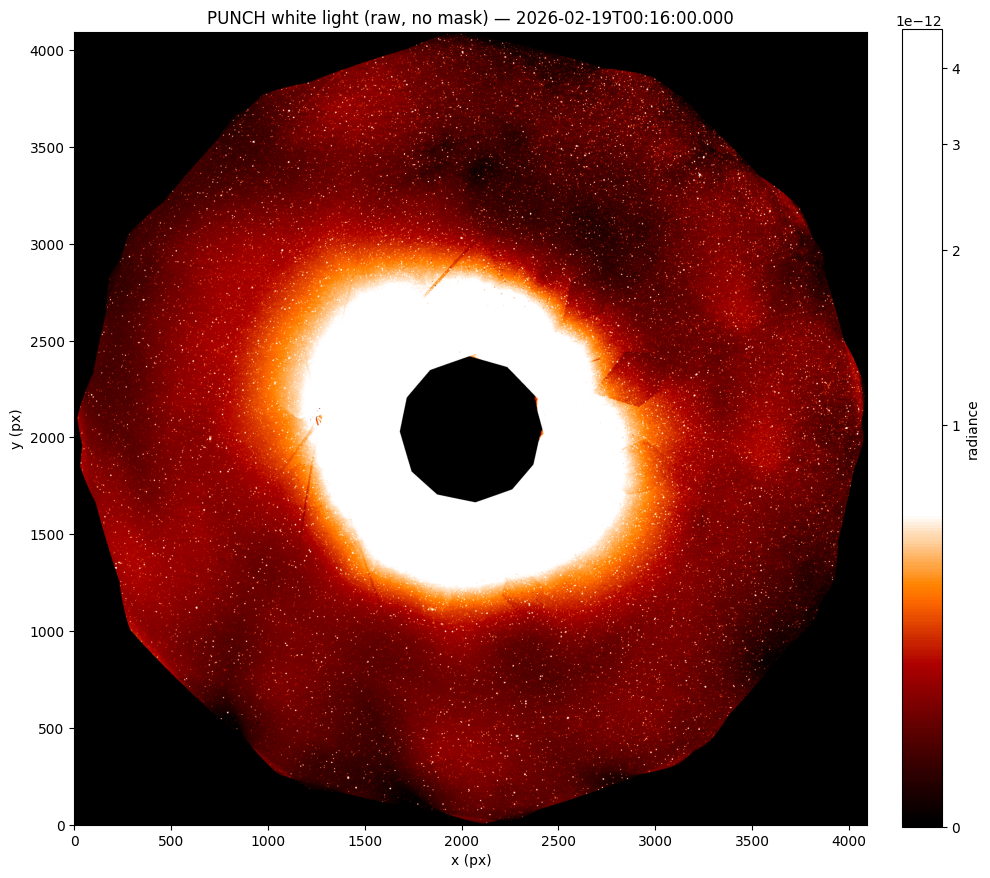

In [3]:
# ============================================================================
# PREVIEW — raw February PUNCH frame
# ============================================================================
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.visualization import AsinhStretch, ImageNormalize, PercentileInterval

os.environ.setdefault("MPLCONFIGDIR", str(PROJECT_ROOT / ".mplconfig"))
os.environ.setdefault("SUNPY_CONFIGDIR", str(PROJECT_ROOT / ".sunpy"))

import sunpy.visualization.colormaps  # registers stereocor2
_cmap = plt.get_cmap("stereocor2")

with fits.open(zenith_light_files[0]) as hdul:
    _img = None
    _hdr = None
    for hdu in hdul:
        if hdu.data is not None and hdu.data.ndim == 2 and hdu.data.size > 1000:
            _img = hdu.data.astype(float)
            _hdr = hdu.header
            break

_date = _hdr.get("DATE-OBS", "2026-02-19") if _hdr else "2026-02-19"
_norm = ImageNormalize(_img, interval=PercentileInterval(99.0), stretch=AsinhStretch())

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(_img, origin="lower", cmap=_cmap, norm=_norm)
ax.set_title(f"PUNCH white light (raw, no mask) — {_date}")
ax.set_xlabel("x (px)"); ax.set_ylabel("y (px)")
plt.colorbar(ax.images[0], ax=ax, fraction=0.046, pad=0.04, label="radiance")
plt.tight_layout()
plt.show()


### Validate Input Files

In [4]:
# ============================================================================
# FILE VALIDATION
# ============================================================================
import os

def validate_files(file_list, file_type="light"):
    valid_files = []
    for file_path in file_list:
        if not file_path:
            continue
        if not os.path.exists(file_path):
            print(f"WARNING: {file_type} file not found: {file_path}")
            continue
        try:
            with open(file_path, 'rb') as f:
                pass
            valid_files.append(file_path)
            print(f"Valid {file_type} file: {os.path.basename(file_path)}")
        except Exception as e:
            print(f"ERROR: Cannot open {file_type} file {file_path}: {e}")
    return valid_files

print("=" * 60)
print("VALIDATING INPUT FILES")
print("=" * 60)

valid_zenith_light_files = validate_files(zenith_light_files, "light")
valid_zenith_dark_files = validate_files(zenith_dark_files, "dark")
valid_zenith_flat_files = validate_files(zenith_flat_files, "flat")

print()
print(f"Light: {len(valid_zenith_light_files)} valid")
print(f"Dark:  {len(valid_zenith_dark_files)} valid")
print(f"Flat:  {len(valid_zenith_flat_files)} valid")

if len(valid_zenith_light_files) == 0:
    raise ValueError("No valid light files. Check paths in config cell.")
print("Validation complete — ready to run Step 1.")


VALIDATING INPUT FILES
Valid light file: PUNCH_L3_CAM_20260219001600_v0j_MEE.fits

Light: 1 valid
Dark:  0 valid
Flat:  0 valid
Validation complete — ready to run Step 1.


### Run Step 1: Find Centroids

Calls `stacker_implementation.do_stack()`. May take several minutes. Expect many centroids (corona + stars); we filter to the brightest 50 in the next section.

STEP 1: FINDING CENTROIDS (raw PUNCH, no mask)
Processing 1 frame(s)...
Starting...
logpath /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_tab1_bright/CENTROID_OUTPUT20260703195129/LOG20260703195129.txt
using version:v0.6.0
using options:{'m': 30, 'n': 30, 'pxl_tol': 10, 'cutoff': 100, 'img_edge_distance': 5, 'rough_match_threshhold': 36, 'sanity_check_centroids': True, 'experimental_background_subtract': False, 'workDir': '', 'workDir2': '', '-DARK-': '', '-FLAT-': '', 'database': '', 'flag_debug': False, 'flag_display2': False, 'flag_display': True, 'save_dark_flat': False, 'float_fits': False, 'd': 200, 'delete_saturated_blob': False, 'blob_saturation_level': 95, 'blob_radius_extra': 350, 'centroid_gap_blob': 175, 'centroid_gaussian_subtract': True, 'sensitive_mode_stack': True, 'centroid_gaussian_thresh': 10.0, 'min_area': 2, 'sigma_subtract': 0.0, 'background_subtraction_mode': 'annular', 'remove_edgy_centroids': True, 'output_dir': '/Users

/Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/mee2024/stacker_implementation.py:477: RuntimeWarning: invalid value encountered in sqrt
  data = np.maximum(sub / np.sqrt(local_variance) - options['sigma_subtract'], 0)
/Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/mee2024/stacker_implementation.py:477: RuntimeWarning: invalid value encountered in divide
  data = np.maximum(sub / np.sqrt(local_variance) - options['sigma_subtract'], 0)


--- 11.09263801574707 seconds for centroid finding (prepare)---
--- 11.393554925918579 seconds for centroid finding (labelling)---
n centroids initial 5247
n centroids sanity-filtered 5243
--- 11.609318971633911 seconds for centroid finding (all)---
found: [(np.float64(10518.356956524494), np.float64(187.0), (np.float64(2098.6369901626517), np.float64(1267.6113418200414))), (np.float64(7787.065396043219), np.float64(158.0), (np.float64(1999.2233414780148), np.float64(1580.4447498638215))), (np.float64(5018.735184765751), np.float64(66.0), (np.float64(3358.308728553735), np.float64(3231.2492496008435))), (np.float64(4795.70537811167), np.float64(38.0), (np.float64(2049.9254460367015), np.float64(3991.079105492531))), (np.float64(4222.540321417038), np.float64(47.0), (np.float64(243.51680834402205), np.float64(1416.162174850343))), (np.float64(3513.2377036842345), np.float64(60.0), (np.float64(459.0400793791354), np.float64(2287.6229405698327))), (np.float64(3393.097120444865), np.float6

/Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/.venv/lib/python3.12/site-packages/skimage/measure/_regionprops.py:723: RuntimeWarning: invalid value encountered in scalar divide
  tuple(M[_get_element(axis)] / M0 for axis in range(self._ndim))


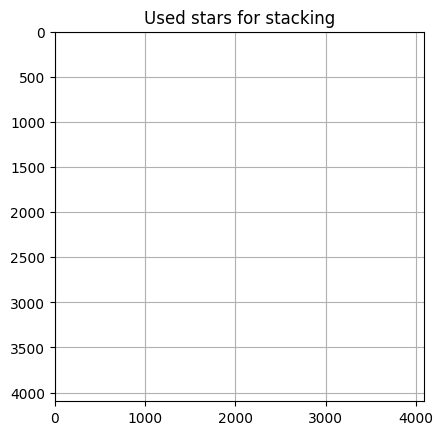

/Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/mee2024/stacker_implementation.py:719: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")


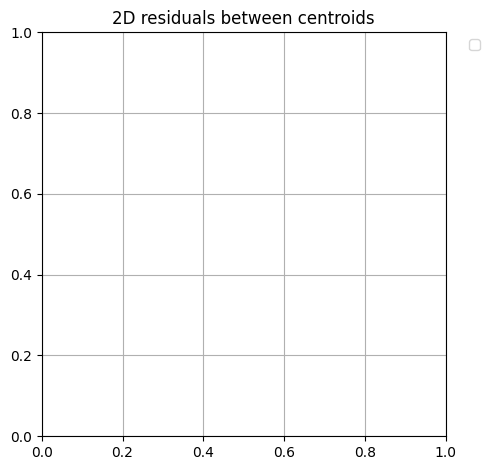

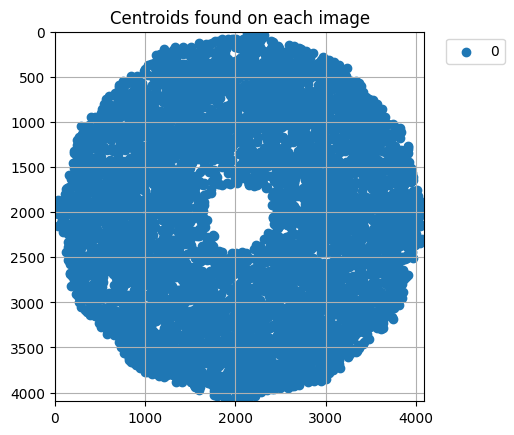

Stacking images...
  1/1


/Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/mee2024/stacker_implementation.py:477: RuntimeWarning: invalid value encountered in sqrt
  data = np.maximum(sub / np.sqrt(local_variance) - options['sigma_subtract'], 0)
/Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/mee2024/stacker_implementation.py:477: RuntimeWarning: invalid value encountered in divide
  data = np.maximum(sub / np.sqrt(local_variance) - options['sigma_subtract'], 0)


--- 9.771162033081055 seconds for centroid finding (prepare)---
--- 9.982058048248291 seconds for centroid finding (labelling)---
n centroids initial 5247


/Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/.venv/lib/python3.12/site-packages/skimage/measure/_regionprops.py:723: RuntimeWarning: invalid value encountered in scalar divide
  tuple(M[_get_element(axis)] / M0 for axis in range(self._ndim))


n centroids sanity-filtered 5243
--- 10.208291053771973 seconds for centroid finding (all)---
found: [(np.float64(10518.356956524494), np.float64(187.0), (np.float64(2098.6369901626517), np.float64(1267.6113418200414))), (np.float64(7787.065396043219), np.float64(158.0), (np.float64(1999.2233414780148), np.float64(1580.4447498638215))), (np.float64(5018.735184765751), np.float64(66.0), (np.float64(3358.308728553735), np.float64(3231.2492496008435))), (np.float64(4795.70537811167), np.float64(38.0), (np.float64(2049.9254460367015), np.float64(3991.079105492531))), (np.float64(4222.540321417038), np.float64(47.0), (np.float64(243.51680834402205), np.float64(1416.162174850343))), (np.float64(3513.2377036842345), np.float64(60.0), (np.float64(459.0400793791354), np.float64(2287.6229405698327))), (np.float64(3393.097120444865), np.float64(35.0), (np.float64(3798.9791182264403), np.float64(2961.0349370937543))), (np.float64(3121.284263255526), np.float64(31.0), (np.float64(1626.788765756034)

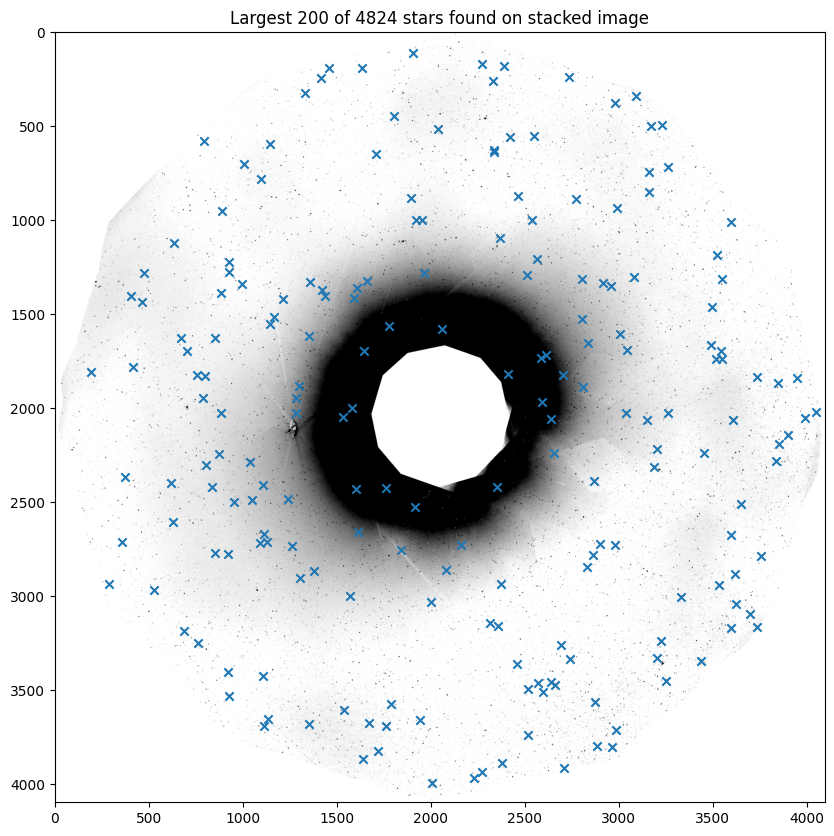

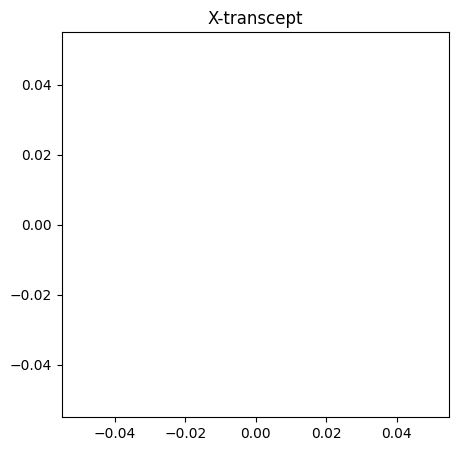

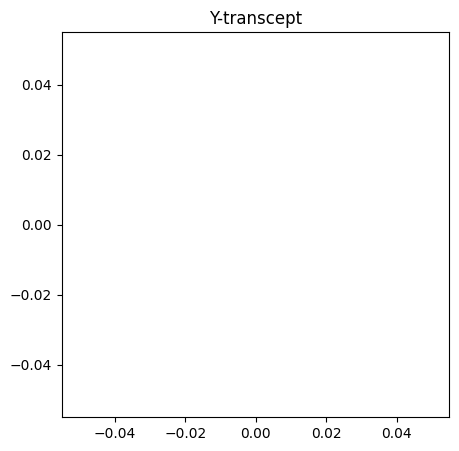

making archive /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_tab1_bright/CENTROID_OUTPUT20260703195129 /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_tab1_bright
Done!

SUCCESS — Step 1 complete.
Output directory: /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_tab1_bright


<Figure size 640x480 with 0 Axes>

In [5]:
# ============================================================================
# STEP 1: STACK AND FIND CENTROIDS
# ============================================================================
print("=" * 60)
print("STEP 1: FINDING CENTROIDS (raw PUNCH, no mask)")
print("=" * 60)
print(f"Processing {len(valid_zenith_light_files)} frame(s)...")
print("Starting...")

try:
    stacker_implementation.do_stack(
        valid_zenith_light_files,
        valid_zenith_dark_files,
        valid_zenith_flat_files,
        options,
    )
    print()
    print("SUCCESS — Step 1 complete.")
    print(f"Output directory: {output_directory}")
except Exception as e:
    print(f"ERROR during stacking: {e}")
    raise


### Step 1 Results

Finds the output ZIP and centroid CSV from the run.

In [6]:
# ============================================================================
# STEP 1 OUTPUT FILES
# ============================================================================
import glob
from pathlib import Path

output_path = Path(output_directory)
print("=" * 60)
print("STEP 1 OUTPUT FILES")
print("=" * 60)
print(f"Searching in: {output_path}")

centroid_zips = sorted(output_path.glob("centroid_data*.zip"), key=lambda x: x.stat().st_mtime, reverse=True)
output_dirs = sorted(output_path.glob("CENTROID_OUTPUT*"), key=lambda x: x.stat().st_mtime if x.is_dir() else 0, reverse=True)

if centroid_zips:
    latest_zip = centroid_zips[0]
    step1_output_file = str(latest_zip)
    print(f"Main output: {latest_zip.name} ({latest_zip.stat().st_size / (1024*1024):.2f} MB)")
    if output_dirs:
        step1_output_dir = output_dirs[0]
        CENTROID_CSV_ALL = str(step1_output_dir / "data" / "STACKED_CENTROIDS_DATA.csv")
        print(f"Output folder: {step1_output_dir.name}")
        print(f"Centroid CSV:  {CENTROID_CSV_ALL}")
    else:
        step1_output_dir = None
        CENTROID_CSV_ALL = None
else:
    print("No output files found yet.")
    step1_output_file = None
    step1_output_dir = None
    CENTROID_CSV_ALL = None


STEP 1 OUTPUT FILES
Searching in: /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_tab1_bright
Main output: centroid_data20260703195129.zip (0.14 MB)
Output folder: CENTROID_OUTPUT20260703195129
Centroid CSV:  /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_tab1_bright/CENTROID_OUTPUT20260703195129/data/STACKED_CENTROIDS_DATA.csv


Using output folder: CENTROID_OUTPUT20260703195129
  USEDSTARS20260703195129.png


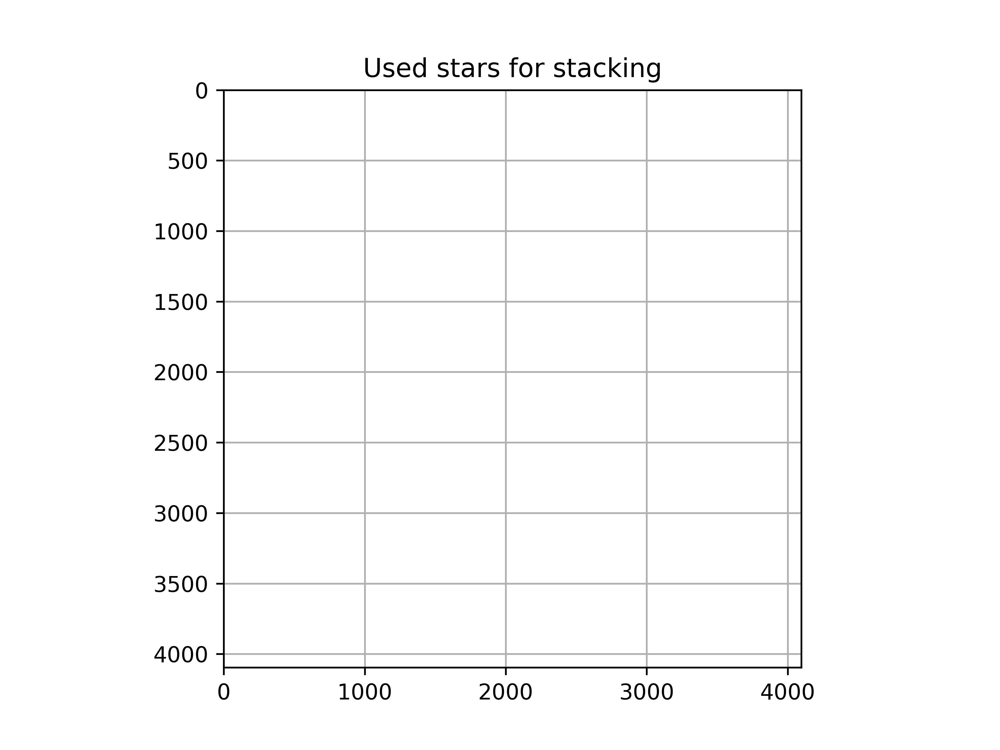

  TWOD_RESIDUALS20260703195129.png


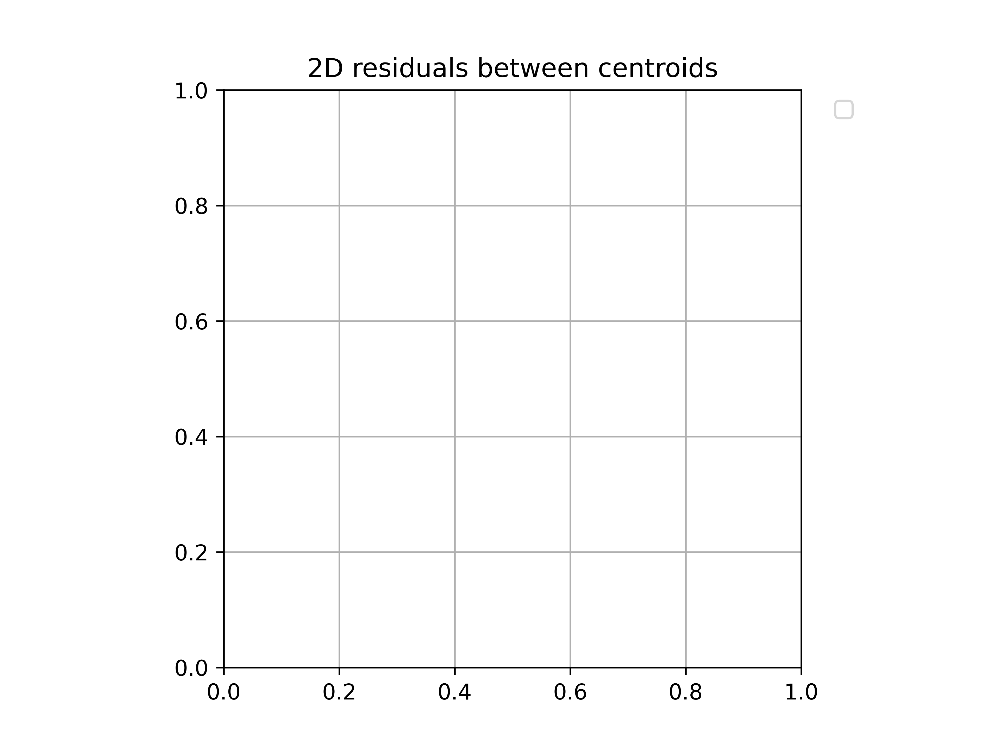

  CentroidsALL20260703195129.png


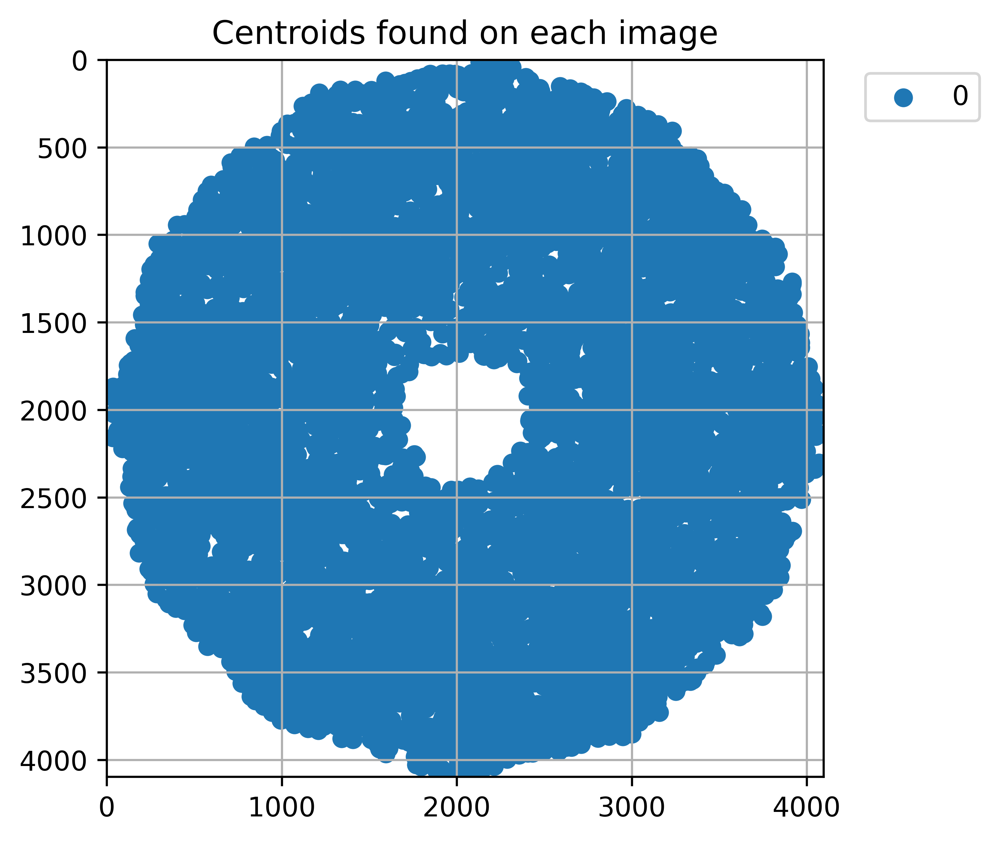

  CentroidsStackGood20260703195129.png


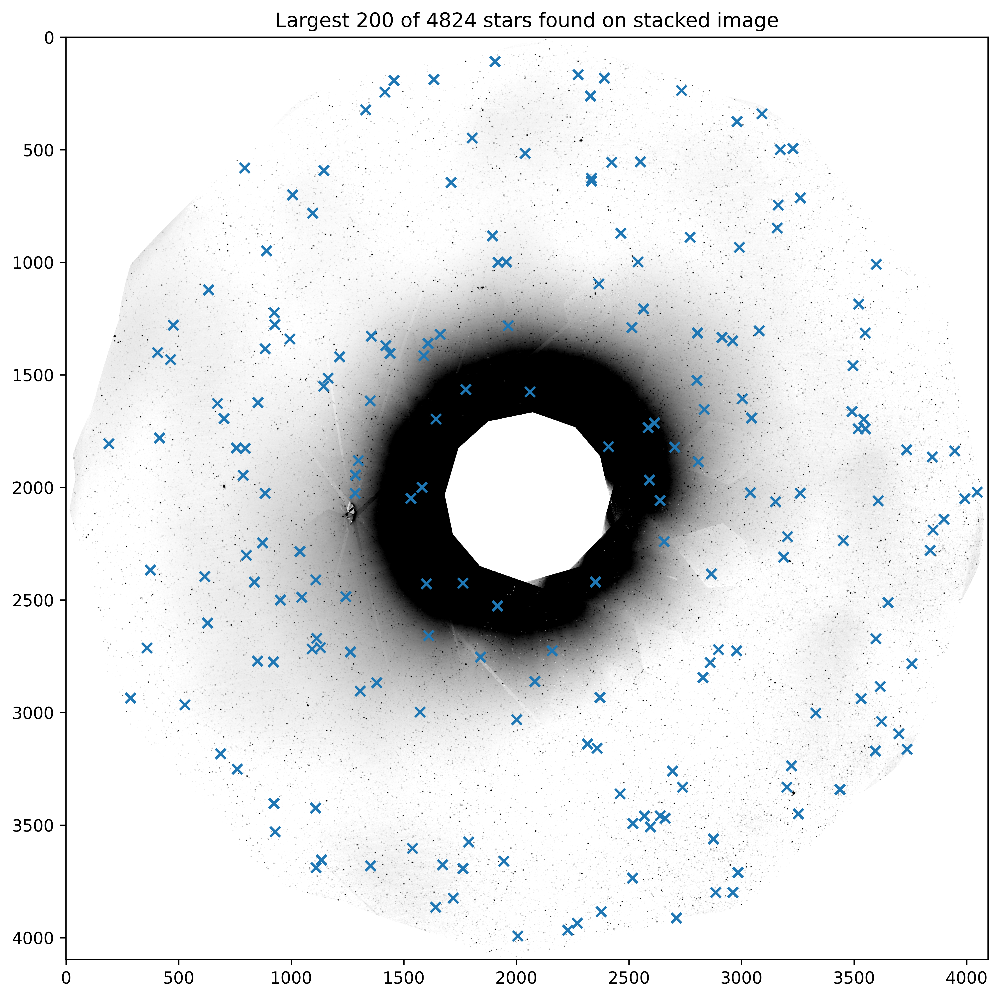

In [7]:
# ============================================================================
# STEP 1 — Display saved plots
# ============================================================================
from pathlib import Path
try:
    from IPython.display import display, Image
except Exception:
    display = None
    Image = None

search_root = Path(output_directory)
output_dirs = sorted(search_root.glob('CENTROID_OUTPUT*'), key=lambda p: p.stat().st_mtime, reverse=True)

if not output_dirs:
    print('No CENTROID_OUTPUT* folder found yet.')
else:
    out = output_dirs[0]
    print(f'Using output folder: {out.name}')
    for stem in ['USEDSTARS', 'TWOD_RESIDUALS', 'CentroidsALL', 'CentroidsStackGood']:
        matches = sorted(out.glob(f'{stem}*.png'), key=lambda p: p.stat().st_mtime, reverse=True)
        if not matches:
            print(f'  (missing) {stem}*.png')
            continue
        p = matches[0]
        print(f'  {p.name}')
        if display and Image:
            display(Image(filename=str(p)))


---
## Brightest-N Filter

Sort all Step 1 centroids by `flux (noise-normed)` and keep the top **50**. These are the candidates we cross-check against Gaia.

Total centroids from Step 1 : 4824
Keeping brightest           : 50 (top 50 by flux)
Flux range (kept)           : 1611.9 – 7787.1
Saved -> /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_tab1_bright/BRIGHTEST_CENTROIDS.csv

   rank           px           py  flux (noise-normed)
0     1  1580.444750  1999.223341          7787.065396
1     2  3991.079105  2049.925446          4795.705378
2     3  1416.162175   243.516808          4222.540321
3     4  2961.034937  3798.979118          3393.097120
4     5   671.639425  1626.788766          3121.284263
5     6  3594.545128  3170.068993          3092.988982
6     7  3261.093611   713.849610          2927.724345
7     8  3252.000216  3449.628248          2897.220044
8     9  2328.627618   261.267983          2864.278508
9    10   927.918137  3528.923251          2860.475432


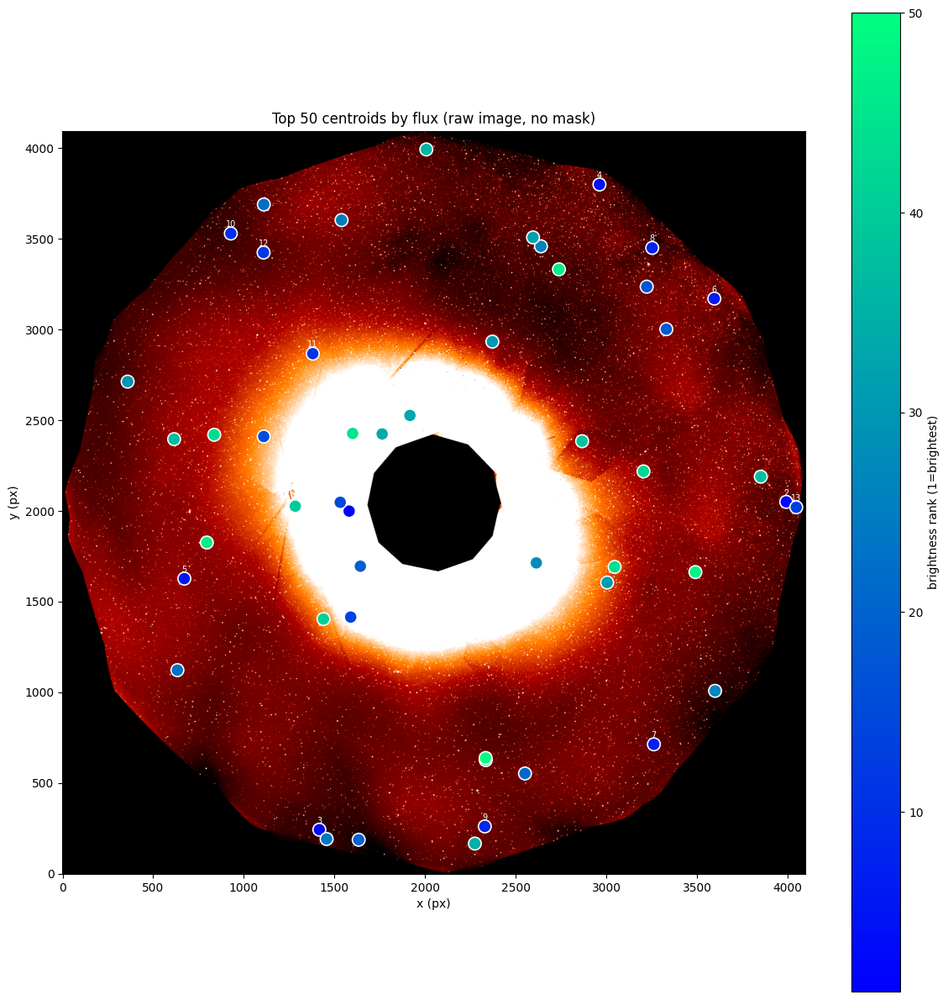

Saved brightest_centroids_overlay.png


In [8]:
# ============================================================================
# BRIGHTEST-N FILTER
# ============================================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from astropy.io import fits
from astropy.visualization import AsinhStretch, ImageNormalize, PercentileInterval

assert CENTROID_CSV_ALL is not None, "Run Step 1 first."
_all = pd.read_csv(CENTROID_CSV_ALL, index_col=0)
_flux_col = "flux (noise-normed)"
_bright = _all.sort_values(_flux_col, ascending=False).head(N_BRIGHTEST).copy()
_bright["rank"] = range(1, len(_bright) + 1)

BRIGHTEST_CSV = str(Path(output_directory) / "BRIGHTEST_CENTROIDS.csv")
_bright.to_csv(BRIGHTEST_CSV)
CENTROID_CSV = BRIGHTEST_CSV

print(f"Total centroids from Step 1 : {len(_all)}")
print(f"Keeping brightest           : {len(_bright)} (top {N_BRIGHTEST} by flux)")
print(f"Flux range (kept)           : {_bright[_flux_col].min():.1f} – {_bright[_flux_col].max():.1f}")
print(f"Saved -> {BRIGHTEST_CSV}")
print()
print(_bright[["rank", "px", "py", _flux_col]].head(10).to_string())

# Plot brightest centroids on raw image
with fits.open(zenith_light_files[0]) as hdul:
    _img = None
    for hdu in hdul:
        if hdu.data is not None and hdu.data.ndim == 2 and hdu.data.size > 1000:
            _img = hdu.data.astype(float)
            break

import sunpy.visualization.colormaps
_cmap = plt.get_cmap("stereocor2")
_norm = ImageNormalize(_img, interval=PercentileInterval(99.0), stretch=AsinhStretch())

fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(_img, origin="lower", cmap=_cmap, norm=_norm)
sc = ax.scatter(_bright["px"], _bright["py"], s=120, c=_bright["rank"], cmap="winter",
                edgecolors="white", linewidths=1.2, zorder=5)
for _, row in _bright.head(15).iterrows():
    ax.annotate(str(int(row["rank"])), (row["px"], row["py"]), color="white", fontsize=7,
                ha="center", va="bottom", xytext=(0, 4), textcoords="offset points")
plt.colorbar(sc, ax=ax, label="brightness rank (1=brightest)")
ax.set_title(f"Top {N_BRIGHTEST} centroids by flux (raw image, no mask)")
ax.set_xlabel("x (px)"); ax.set_ylabel("y (px)")
plt.tight_layout()
plt.savefig(Path(output_directory) / "brightest_centroids_overlay.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved brightest_centroids_overlay.png")


---
# Gaia Matching — validate brightest centroids

Compare the top-50 brightest detections against Gaia stars with **G < 4**. Needs internet for the Gaia query.

In [16]:
# ============================================================================
# GAIA MATCH — 1) Config
# ============================================================================
import os
from pathlib import Path

MATCH_TOL_PIXELS = 2.0
SEARCH_MARGIN_DEG = 2.0

PUNCH_WCS_FITS = str(PROJECT_ROOT / "PUNCH_L3_CAM_20260219001600_v0j_MEE.fits")
GAIA_OUT_DIR = output_directory
SUN_CENTER_PX = (2048.0, 2048.0)

os.environ.setdefault("SUNPY_CONFIGDIR", str(PROJECT_ROOT / ".sunpy"))

assert Path(CENTROID_CSV).exists(), f"Brightest centroid CSV not found: {CENTROID_CSV}. Run brightest filter first."

print("Gaia-match config:")
print("  centroid CSV :", CENTROID_CSV)
print("  PUNCH WCS    :", PUNCH_WCS_FITS)
print("  mag limit    :", GAIA_MAG_LIMIT)
print("  match tol    :", MATCH_TOL_PIXELS, "px")
print("  output dir   :", GAIA_OUT_DIR)


Gaia-match config:
  centroid CSV : /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_tab1_bright/BRIGHTEST_CENTROIDS.csv
  PUNCH WCS    : /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/PUNCH_L3_CAM_20260219001600_v0j_MEE.fits
  mag limit    : 4.0
  match tol    : 2.0 px
  output dir   : /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_tab1_bright


In [ ]:
# ============================================================================
# GAIA MATCH — 2) Load PUNCH SunPy map
# ============================================================================
import numpy as np
import astropy.units as u
from astropy.coordinates import get_sun
import sunpy.map
import sunpy.coordinates

def _load_punch_map(path):
    m = sunpy.map.Map(path)
    if isinstance(m, (list, tuple)):
        m = m[0]
    return m

punch_map = _load_punch_map(PUNCH_WCS_FITS)

print("SunPy map loaded")
print("  date        :", punch_map.date)
print("  frame       :", punch_map.coordinate_frame.name)
print("  shape       :", punch_map.data.shape)

sun_icrs = get_sun(punch_map.date)
center_ra, center_dec = float(sun_icrs.ra.deg), float(sun_icrs.dec.deg)
print(f"  Sun apparent ICRS: RA={center_ra:.4f}  Dec={center_dec:.4f}")

_scale = punch_map.scale
_cdelt_deg = float(_scale[0].to_value(u.deg / u.pix))
_ny, _nx = punch_map.data.shape
_half_diag_px = 0.5 * np.hypot(_nx, _ny)
SEARCH_RADIUS_DEG = _half_diag_px * _cdelt_deg + SEARCH_MARGIN_DEG
print(f"  plate scale: {_cdelt_deg*3600:.1f} arcsec/px  ->  Gaia cone radius: {SEARCH_RADIUS_DEG:.1f} deg")


SunPy map loaded
  date        : 2026-02-19T00:16:00.000
  frame       : helioprojective
  shape       : (4096, 4096)
  Sun apparent ICRS: RA=332.0757  Dec=-11.4755
  plate scale: 81.0 arcsec/px  ->  Gaia cone radius: 67.2 deg


In [17]:
# ============================================================================
# GAIA MATCH — 3) Query Gaia (needs internet)
# ============================================================================
from astroquery.gaia import Gaia

_gaia_query = (
    "SELECT ra, dec, phot_g_mean_mag, parallax, pmra, pmdec, radial_velocity, ref_epoch "
    "FROM gaiadr3.gaia_source "
    f"WHERE phot_g_mean_mag < {GAIA_MAG_LIMIT} "
    f"AND CONTAINS(POINT('ICRS', ra, dec), "
    f"CIRCLE('ICRS', {center_ra}, {center_dec}, {SEARCH_RADIUS_DEG})) = 1"
)
print("Submitting Gaia query...")
gaia_job = Gaia.launch_job_async(_gaia_query)
gaia = gaia_job.get_results()
print(f"Gaia returned {len(gaia)} stars brighter than G={GAIA_MAG_LIMIT} within {SEARCH_RADIUS_DEG:.1f} deg")
gaia[:5].pprint(max_width=200)


Submitting Gaia query...


KeyboardInterrupt: 

In [12]:
# ============================================================================
# GAIA MATCH — 4) Proper motion to obs date, project to pixels
# ============================================================================
import numpy as np
import astropy.units as u
from astropy.coordinates import SkyCoord, Distance
from astropy.time import Time

def _col(name, fill=0.0):
    a = np.ma.getdata(gaia[name]).astype(float)
    m = np.ma.getmaskarray(gaia[name])
    return np.where(m | ~np.isfinite(a), fill, a)

_plx = _col('parallax', fill=1e-3)
_plx = np.where(_plx > 1e-3, _plx, 1e-3)
_dist = Distance(parallax=_plx * u.mas)

_gaia_crds = SkyCoord(
    ra=_col('ra') * u.deg, dec=_col('dec') * u.deg,
    distance=_dist,
    pm_ra_cosdec=_col('pmra') * (u.mas / u.yr),
    pm_dec=_col('pmdec') * (u.mas / u.yr),
    radial_velocity=_col('radial_velocity') * (u.km / u.s),
    frame='icrs',
    obstime=Time(_col('ref_epoch', fill=2016.0), format='jyear'),
)
_gaia_now = _gaia_crds.apply_space_motion(new_obstime=punch_map.date)

_gx, _gy = punch_map.world_to_pixel(_gaia_now)
gaia_px = np.asarray(_gx.value if hasattr(_gx, "value") else _gx, dtype=float)
gaia_py = np.asarray(_gy.value if hasattr(_gy, "value") else _gy, dtype=float)
gaia_mag = np.asarray(gaia['phot_g_mean_mag'], dtype=float)

_ny, _nx = punch_map.data.shape
_in_frame = (gaia_px >= 0) & (gaia_px < _nx) & (gaia_py >= 0) & (gaia_py < _ny)
_keep = _in_frame

gaia_px, gaia_py, gaia_mag = gaia_px[_keep], gaia_py[_keep], gaia_mag[_keep]
print(f"Gaia stars in query           : {len(_keep)}")
print(f"  ...projected inside frame   : {int(_keep.sum())}")


Gaia stars in query           : 176
  ...projected inside frame   : 97


In [13]:
# ============================================================================
# GAIA MATCH — 5) Match brightest centroids <-> Gaia
# ============================================================================
import pandas as pd
from sklearn.neighbors import NearestNeighbors

_cen_df = pd.read_csv(CENTROID_CSV)
cen_x = _cen_df['px'].to_numpy(dtype=float)
cen_y = _cen_df['py'].to_numpy(dtype=float)
cen_flux = _cen_df['flux (noise-normed)'].to_numpy(dtype=float)
cen_rank = _cen_df['rank'].to_numpy(dtype=int) if 'rank' in _cen_df.columns else np.arange(1, len(_cen_df)+1)
cen_xy = np.c_[cen_x, cen_y]
gaia_xy = np.c_[gaia_px, gaia_py]

n_cen, n_gaia = len(cen_xy), len(gaia_xy)
print(f"Brightest centroids: {n_cen}   Gaia stars in frame (G<{GAIA_MAG_LIMIT}): {n_gaia}")

if n_gaia == 0:
    raise RuntimeError("No Gaia stars in frame — check WCS or magnitude limit.")

_nn_g = NearestNeighbors(n_neighbors=1).fit(gaia_xy)
d_c2g, i_c2g = _nn_g.kneighbors(cen_xy)
d_c2g, i_c2g = d_c2g[:, 0], i_c2g[:, 0]
centroid_matched = d_c2g < MATCH_TOL_PIXELS

_nn_c = NearestNeighbors(n_neighbors=1).fit(cen_xy)
d_g2c, i_g2c = _nn_c.kneighbors(gaia_xy)
d_g2c = d_g2c[:, 0]
gaia_detected = d_g2c < MATCH_TOL_PIXELS

n_matched   = int(centroid_matched.sum())
n_unmatched = n_cen - n_matched
n_detected  = int(gaia_detected.sum())
purity       = 100.0 * n_matched / n_cen if n_cen else 0.0
completeness = 100.0 * n_detected / n_gaia if n_gaia else 0.0

print(f"\nMatch tolerance: {MATCH_TOL_PIXELS} px (~{MATCH_TOL_PIXELS*81:.0f} arcsec)")
print(f"  Brightest centroids matched to Gaia : {n_matched} / {n_cen}   (purity {purity:.1f}%)")
print(f"  Brightest centroids with NO Gaia    : {n_unmatched}")
print(f"  Gaia G<{GAIA_MAG_LIMIT} stars we detected       : {n_detected} / {n_gaia}   (completeness {completeness:.1f}%)")
if n_matched:
    print(f"  Median match distance (matched)     : {np.median(d_c2g[centroid_matched]):.3f} px")


Brightest centroids: 50   Gaia stars in frame (G<4.0): 97

Match tolerance: 2.0 px (~162 arcsec)
  Brightest centroids matched to Gaia : 44 / 50   (purity 88.0%)
  Brightest centroids with NO Gaia    : 6
  Gaia G<4.0 stars we detected       : 44 / 97   (completeness 45.4%)
  Median match distance (matched)     : 0.318 px


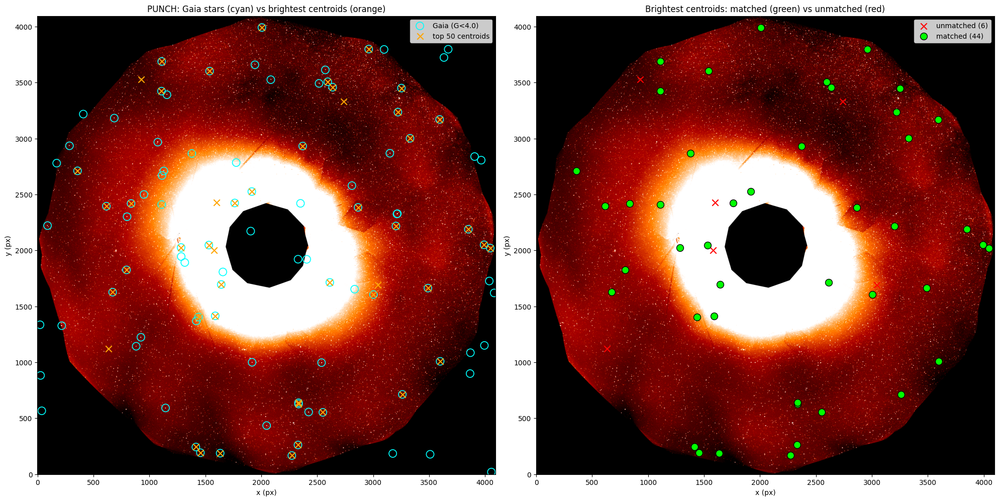

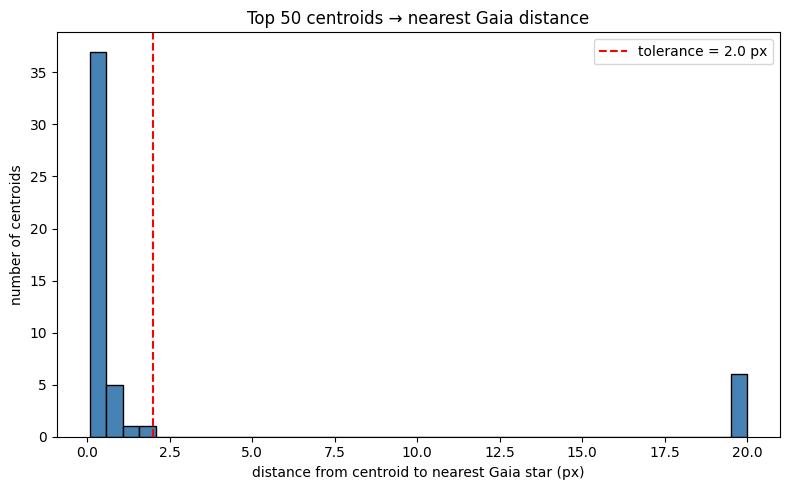

Saved plots to /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_tab1_bright


In [14]:
# ============================================================================
# GAIA MATCH — 6) Plots
# ============================================================================
import matplotlib.pyplot as plt
from astropy.visualization import AsinhStretch, ImageNormalize, PercentileInterval
import sunpy.visualization.colormaps

_img = punch_map.data.astype(float)
_cmap = plt.get_cmap("stereocor2")
_norm = ImageNormalize(_img, interval=PercentileInterval(99.0), stretch=AsinhStretch())

fig, axes = plt.subplots(1, 2, figsize=(20, 10))

ax = axes[0]
ax.imshow(_img, origin="lower", cmap=_cmap, norm=_norm)
ax.scatter(gaia_px, gaia_py, s=120, facecolors="none", edgecolors="cyan", linewidths=1.2,
           label=f"Gaia (G<{GAIA_MAG_LIMIT})")
ax.scatter(cen_x, cen_y, s=80, c="orange", marker="x", linewidths=1.5, label=f"top {N_BRIGHTEST} centroids")
ax.set_title("PUNCH: Gaia stars (cyan) vs brightest centroids (orange)")
ax.set_xlabel("x (px)"); ax.set_ylabel("y (px)")
ax.legend(loc="upper right")

ax = axes[1]
ax.imshow(_img, origin="lower", cmap=_cmap, norm=_norm)
ax.scatter(cen_x[~centroid_matched], cen_y[~centroid_matched], s=80, c="red", marker="x",
           linewidths=1.5, label=f"unmatched ({n_unmatched})")
ax.scatter(cen_x[centroid_matched], cen_y[centroid_matched], s=100, c="lime", marker="o",
           edgecolors="k", label=f"matched ({n_matched})")
ax.set_title("Brightest centroids: matched (green) vs unmatched (red)")
ax.set_xlabel("x (px)"); ax.set_ylabel("y (px)")
ax.legend(loc="upper right")

plt.tight_layout()
plt.savefig(Path(GAIA_OUT_DIR) / "gaia_match_overlay.png", dpi=150, bbox_inches="tight")
plt.show()

plt.figure(figsize=(8, 5))
plt.hist(np.clip(d_c2g, 0, 20), bins=40, color="steelblue", edgecolor="k")
plt.axvline(MATCH_TOL_PIXELS, color="red", ls="--", label=f"tolerance = {MATCH_TOL_PIXELS} px")
plt.xlabel("distance from centroid to nearest Gaia star (px)")
plt.ylabel("number of centroids")
plt.title(f"Top {N_BRIGHTEST} centroids → nearest Gaia distance")
plt.legend()
plt.tight_layout()
plt.savefig(Path(GAIA_OUT_DIR) / "gaia_match_distance_hist.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved plots to", GAIA_OUT_DIR)


In [15]:
# ============================================================================
# GAIA MATCH — 7) Summary + save matched catalog
# ============================================================================
import pandas as pd
from pathlib import Path

summary = pd.DataFrame({
    "metric": [
        f"Gaia stars in frame (G<{GAIA_MAG_LIMIT})",
        f"Brightest centroids tested (top {N_BRIGHTEST})",
        "Centroids matched to Gaia",
        "Centroids unmatched",
        f"Gaia G<{GAIA_MAG_LIMIT} stars detected",
        "Purity (matched / centroids)",
        "Completeness (detected / Gaia)",
        "Match tolerance (px)",
        "Median match dist (matched, px)",
    ],
    "value": [
        n_gaia, n_cen, n_matched, n_unmatched, n_detected,
        f"{purity:.1f}%", f"{completeness:.1f}%", MATCH_TOL_PIXELS,
        f"{np.median(d_c2g[centroid_matched]):.3f}" if n_matched else "n/a",
    ],
})
print(summary.to_string(index=False))

_matched_rows = pd.DataFrame({
    "rank": cen_rank[centroid_matched],
    "centroid_px": cen_x[centroid_matched],
    "centroid_py": cen_y[centroid_matched],
    "centroid_flux": cen_flux[centroid_matched],
    "gaia_px": gaia_px[i_c2g[centroid_matched]],
    "gaia_py": gaia_py[i_c2g[centroid_matched]],
    "gaia_G_mag": gaia_mag[i_c2g[centroid_matched]],
    "match_dist_px": d_c2g[centroid_matched],
})
_unmatched_rows = pd.DataFrame({
    "rank": cen_rank[~centroid_matched],
    "centroid_px": cen_x[~centroid_matched],
    "centroid_py": cen_y[~centroid_matched],
    "centroid_flux": cen_flux[~centroid_matched],
    "nearest_gaia_dist_px": d_c2g[~centroid_matched],
})

_out_matched = Path(GAIA_OUT_DIR) / "PUNCH_BRIGHT_GAIA_MATCHED.csv"
_out_unmatched = Path(GAIA_OUT_DIR) / "PUNCH_BRIGHT_GAIA_UNMATCHED.csv"
_out_summary = Path(GAIA_OUT_DIR) / "PUNCH_BRIGHT_GAIA_SUMMARY.csv"
_matched_rows.to_csv(_out_matched, index=False)
_unmatched_rows.to_csv(_out_unmatched, index=False)
summary.to_csv(_out_summary, index=False)

print(f"\nSaved matched   -> {_out_matched}  ({len(_matched_rows)} rows)")
print(f"Saved unmatched -> {_out_unmatched}  ({len(_unmatched_rows)} rows)")
print(f"Saved summary   -> {_out_summary}")


                             metric value
        Gaia stars in frame (G<4.0)    97
Brightest centroids tested (top 50)    50
          Centroids matched to Gaia    44
                Centroids unmatched     6
          Gaia G<4.0 stars detected    44
       Purity (matched / centroids) 88.0%
     Completeness (detected / Gaia) 45.4%
               Match tolerance (px)   2.0
    Median match dist (matched, px) 0.318

Saved matched   -> /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_tab1_bright/PUNCH_BRIGHT_GAIA_MATCHED.csv  (44 rows)
Saved unmatched -> /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_tab1_bright/PUNCH_BRIGHT_GAIA_UNMATCHED.csv  (6 rows)
Saved summary   -> /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_tab1_bright/PUNCH_BRIGHT_GAIA_SUMMARY.csv


---
## Run checklist

1. **Setup** — imports + database init
2. **Config** — confirm paths and settings printed above
3. **Preview** — raw February PUNCH image
4. **Validate** — FITS exists
5. **Step 1** — `do_stack()` (several minutes; expect many centroids)
6. **Results** — check plots
7. **Brightest filter** — top 50 by flux
8. **Gaia match** — needs internet; compares brightest 50 vs Gaia G < 4

**Note:** Step 1 will find corona junk along with real stars. The brightest-by-flux filter is what keeps the real stars for Gaia validation.